# Name : Vilohit Keshava Murthy Achar
# ID : 23077751
# Name : Mohit Chandrashekhar Attarde
# ID : 23241977

The code executes completely without any error

Execution Time: 2 hours 50 minutes

CS6482 Deep Reinforcement Learning
Assignment 2 DQN CartPole Classic Control


•	Correct the bugs.
•	Comment the code extensively.
•	Replace CartPole with a different Classic Control problem form gym.
•	Generate more informative plots i.e. plot running average.
•	Consider generating an animation.
•	Play around with hyperparameters and parameters to achieve ‘satisfactory’ performance.

# Outline for the notebook

1. Setup
    Env[MountainCar]
    Reset Environment State
    DisplayObservationSpace
2. Deep Q-Network
3. Fixed Q-targets Q-Network
4. Double Deep Q-Network
    
    - Hyperparameters
    - Model Network
    - Training and Action Step
    - Training Model
    - Plotting Results
    - Saving Model
    - Testing Saved Model
    - Animating Episodes from testing

# Setup

After testing and implementing different versions of Gym from 25.0 to 26.2, this is our final version, which is compatible with different platforms

In [ ]:
!pip install gym==0.25.0

     ---------------------------------------- 0.0/720.4 kB ? eta -:--:--
      --------------------------------------- 10.2/720.4 kB ? eta -:--:--
     ---------- --------------------------- 194.6/720.4 kB 3.0 MB/s eta 0:00:01
     -------------------------------------  716.8/720.4 kB 6.5 MB/s eta 0:00:01
     -------------------------------------- 720.4/720.4 kB 6.5 MB/s eta 0:00:00
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Installing backend dependencies: started
  Installing backend dependencies: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Created wheel for gym: filename=gym-0.25.0-py3-none-any.whl size=824410 sha256=447b2a55d673fbd10c132602cf8ffaea1062710bb0a9eb32d6d417bda4b67468
  Stored in directory: c:\users

In [8]:
# Python version 3.11 and 3.12 are compatible
import sys
assert sys.version_info >= (3,10)

import os
os.environ['SDL_VIDEODRIVER'] = 'dummy'

import gym

# Animation from frames captured in env.render()
import matplotlib.animation
import matplotlib.pyplot as plt

import numpy as np
import random

# Display animation on notebook
from IPython.display import HTML

from packaging import version

import tensorflow as tf
assert version.parse(tf.__version__) >= version.parse("2.15.0")


In [2]:
# Tried the notebook on CPU and Tesla V100 GPU
if not tf.config.list_physical_devices('GPU'):
    print("Get a GPU ......")

Get a GPU ......


In [3]:
# Versions used for this notebook
print(gym.__version__)
print(sys.version)

0.25.0
3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]


In [4]:
# Check all the available env in gym lib
envs = gym.envs.registry
sorted(envs.keys()) + ["..."]
envs['MountainCar-v0']

EnvSpec(id='MountainCar-v0', entry_point='gym.envs.classic_control.mountain_car:MountainCarEnv', reward_threshold=-110.0, nondeterministic=False, max_episode_steps=200, order_enforce=True, autoreset=False, disable_env_checker=False, new_step_api=False, kwargs={}, namespace=None, name='MountainCar', version=0)

In [5]:
# New step API used for headless simulations
new_step_API = True
env = gym.make('MountainCar-v0', render_mode="rgb_array")

C:\Users\mohit\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\gym\core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
C:\Users\mohit\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\gym\wrappers\step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


In [6]:
# Check summary of the gym environment
states = env.observation_space
high_states = env.observation_space.high
low_states = env.observation_space.low

actions = env.action_space
reward_range = env.reward_range

print(states)
print(high_states)
print(low_states)

print(actions)
print(reward_range)

Box([-1.2  -0.07], [0.6  0.07], (2,), float32)
[0.6  0.07]
[-1.2  -0.07]
Discrete(3)
(-inf, inf)


## Reset State of the Car

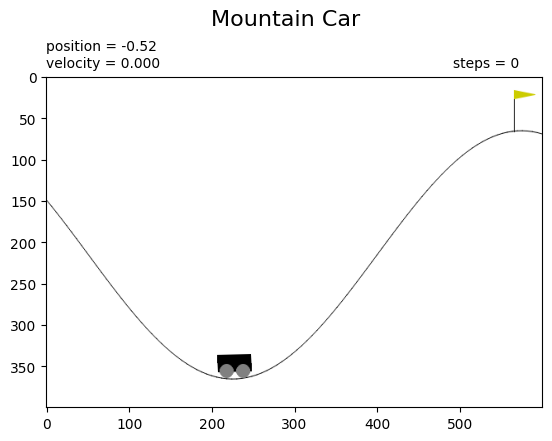

In [15]:
obs = env.reset(seed=random.randint(0, (2**24)))

state_text_01 = f'position = {obs[0]:.2f}\n'
state_text_01 += f'velocity = {obs[1]:.3f}'
state_text_02 = f'steps = 0'

img = env.render()
img = np.squeeze(img) # gym ver 0.25.0 return different shape

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)
plt.suptitle('Mountain Car', fontsize=16)
plt.imshow(img)
plt.text(0, 1.03, state_text_01, fontsize=10, transform=ax.transAxes)
plt.text(0.82, 1.03, state_text_02, fontsize=10, transform=ax.transAxes)
plt.show()

# Deep Q-Network

## Hyperparameters

In [16]:
env.reset(seed=42)

epsilon = 1
epsilon_min = .01
epsilon_decay = .995

rewards = []
best_score = 199

loss_values =[]
epsilon_values =[]
step_values = []
policy_values = []

## Model Network

In [17]:
np.random.seed(42)
tf.random.set_seed(42)

input_shape = env.observation_space.shape
n_outputs = env.action_space.n


model_deep = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation="relu", input_shape=input_shape),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(n_outputs)
])

## Training and Action Step

In [18]:
def epsilon_greedy_policy(state, epsilon):
    if np.random.rand() < epsilon:
        return np.random.randint(n_outputs)
    else:
        Q_values = model_deep.predict(state[np.newaxis], verbose=0)[0]
        return Q_values.argmax()

In [19]:
from collections import deque
replay_buffer = deque(maxlen=2000)

In [20]:
def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_buffer), size=batch_size)
    batch = [replay_buffer[index] for index in indices]
    return [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(5)
    ]  # [states, actions, rewards, next_states, dones, truncateds]

In [21]:
def play_one_step(env, state, epsilon):
    action = epsilon_greedy_policy(state, epsilon)
    policy_values.append(action)
    next_state, reward, done, info = env.step(action)
    if next_state[0] - state[0] > 0 and action == 2: reward = 1
    if next_state[0] - state[0] < 0 and action == 0: reward = 1
    replay_buffer.append((state, action, reward, next_state, done))
    return next_state, reward, done, info


In [22]:
batch_size = 64
discount_factor = 0.95
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
loss_fn = tf.keras.losses.mean_squared_error

def training_step(batch_size):

    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones = experiences
    policy_values.append(actions)
    next_Q_values = model_deep.predict(next_states, verbose=0)
    max_next_Q_values = next_Q_values.max(axis=1)
    runs = 1.0 - (dones)
    target_Q_values = rewards + runs * discount_factor * max_next_Q_values
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model_deep(states)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
        loss_values.append(loss)

    grads = tape.gradient(loss, model_deep.trainable_variables)
    optimizer.apply_gradients(zip(grads, model_deep.trainable_variables))

## Training Model

In [25]:
episodes=600

for episode in range(episodes):
    obs = env.reset()
    for step in range(200):
        obs, reward, done, info  = play_one_step(env,obs, epsilon)
        if done:
            break

    epsilon_values.append(epsilon)
    rewards.append(reward)
    step_values.append(step)

    if epsilon > epsilon_min:
      epsilon *= epsilon_decay

    if step <= best_score:
        best_weights = model_deep.get_weights()
        best_score = step

    print("\rEpisode: {}, Step: {}, eps: {:.3f}".format(episode, best_score, epsilon))

    if episode > 50:
        training_step(batch_size)

model_deep.set_weights(best_weights)

Episode: 0, Step: 199, eps: 0.946
Episode: 1, Step: 199, eps: 0.942
Episode: 2, Step: 199, eps: 0.937
Episode: 3, Step: 199, eps: 0.932
Episode: 4, Step: 199, eps: 0.928
Episode: 5, Step: 199, eps: 0.923
Episode: 6, Step: 199, eps: 0.918
Episode: 7, Step: 199, eps: 0.914
Episode: 8, Step: 199, eps: 0.909
Episode: 9, Step: 199, eps: 0.905
Episode: 10, Step: 199, eps: 0.900
Episode: 11, Step: 199, eps: 0.896
Episode: 12, Step: 199, eps: 0.891
Episode: 13, Step: 199, eps: 0.887
Episode: 14, Step: 199, eps: 0.882
Episode: 15, Step: 199, eps: 0.878
Episode: 16, Step: 199, eps: 0.873
Episode: 17, Step: 199, eps: 0.869
Episode: 18, Step: 199, eps: 0.865
Episode: 19, Step: 199, eps: 0.860
Episode: 20, Step: 199, eps: 0.856
Episode: 21, Step: 199, eps: 0.852
Episode: 22, Step: 199, eps: 0.848
Episode: 23, Step: 199, eps: 0.843
Episode: 24, Step: 199, eps: 0.839
Episode: 25, Step: 199, eps: 0.835
Episode: 26, Step: 199, eps: 0.831
Episode: 27, Step: 199, eps: 0.827
Episode: 28, Step: 199, eps: 0

## Plotting trends

### Epsilon over Episodes

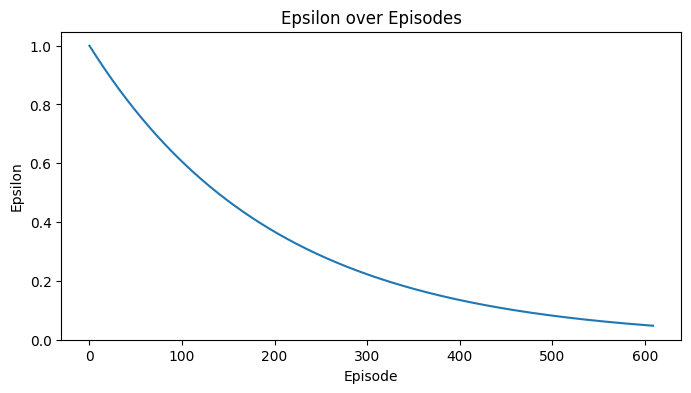

In [26]:
plt.figure(figsize=(8, 4))
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon')
plt.title('Epsilon over Episodes')
plt.show()

### Reward over Episodes

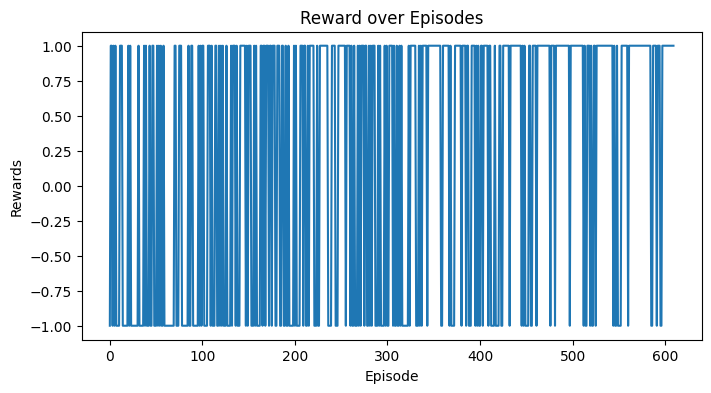

In [27]:
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode")
plt.ylabel("Rewards")
plt.title('Reward over Episodes')
plt.show()

### Number of Steps taken for winning with Reward

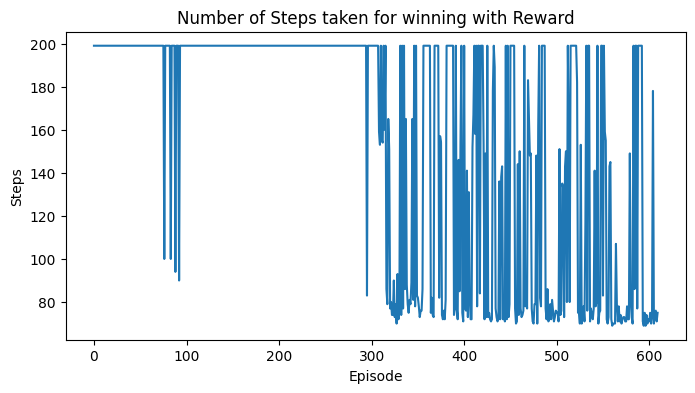

In [28]:
plt.figure(figsize=(8, 4))
plt.plot(step_values)
plt.xlabel("Episode")
plt.ylabel("Steps")
plt.title('Number of Steps taken for winning with Reward')
plt.show()

### Loss over Episode

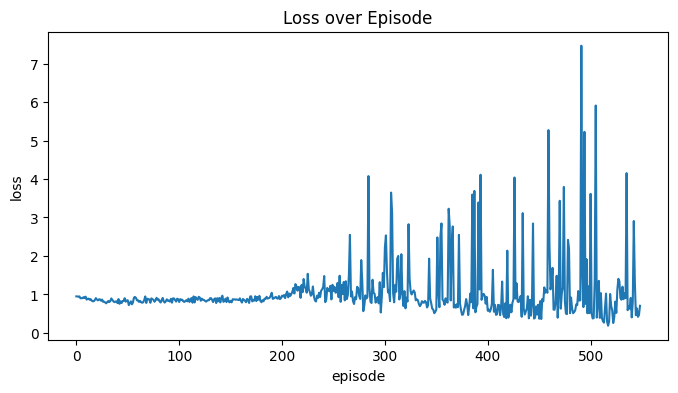

In [29]:
plt.figure(figsize=(8, 4))
plt.plot(loss_values)
plt.xlabel('episode')
plt.ylabel('loss')
plt.title('Loss over Episode')
plt.show()

### Saving the model

In [30]:
model_deep.save('./model_deep_{}.keras'.format(episode))

### Testing the saved model

In [31]:
from tensorflow.keras.saving import load_model

Test_model_Deep = load_model("./model_deep_599.keras")

episode_total = 50
steps = 200
frames_per_episode = []
car_reached = 0

for episode in range(episode_total):
    episode_frames  = []
    current_state = env.reset()
    for step in range(steps):
        frame = env.render()
        episode_frames.append(frame)
        action_step = np.argmax(Test_model_Deep.predict(np.expand_dims(current_state, axis=0), verbose=0))
        new_state, reward, done, info = env.step(action_step)
        if done:
            car_reached += 1
            print(f'Car reached in episode: {episode}')
            break
        current_state = new_state
    frames_per_episode.append(episode_frames)
print(f'Car reached the top {car_reached} times out of {episode_total}')

Car reached in episode: 0
Car reached in episode: 1
Car reached in episode: 2
Car reached in episode: 3
Car reached in episode: 4
Car reached in episode: 5
Car reached in episode: 6
Car reached in episode: 7
Car reached in episode: 8
Car reached in episode: 9
Car reached in episode: 10
Car reached in episode: 11
Car reached in episode: 12
Car reached in episode: 13
Car reached in episode: 14
Car reached in episode: 15
Car reached in episode: 16
Car reached in episode: 17
Car reached in episode: 18
Car reached in episode: 19
Car reached in episode: 20
Car reached in episode: 21
Car reached in episode: 22
Car reached in episode: 23
Car reached in episode: 24
Car reached in episode: 25
Car reached in episode: 26
Car reached in episode: 27
Car reached in episode: 28
Car reached in episode: 29
Car reached in episode: 30
Car reached in episode: 31
Car reached in episode: 32
Car reached in episode: 33
Car reached in episode: 34
Car reached in episode: 35
Car reached in episode: 36
Car reached

### Animation of the car

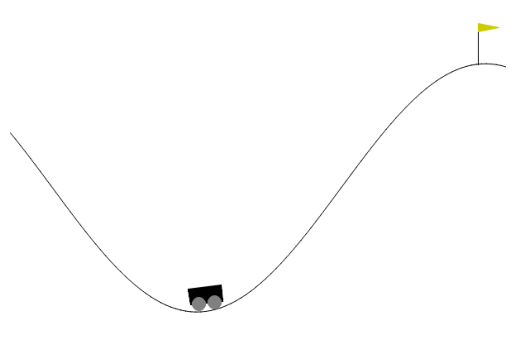

In [87]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter, PillowWriter
from IPython.display import HTML

fig, ax = plt.subplots()

def update(frame):
    ax.clear()
    frame = np.squeeze(frame)
    ax.imshow(frame)
    ax.axis('off')

# Select which episode to animate
episode_to_animate = 6  # Change this to choose different episodes

ani = FuncAnimation(fig, update, frames=frames_per_episode[episode_to_animate], interval=1)
ani.save('Deep_Animation.gif', writer=PillowWriter(fps=5))

HTML(ani.to_jshtml())

# Fixed Q-target Deep Q-Network

## Hyperparameters

In [33]:
env.reset(seed=42)

epsilon = 1
epsilon_min = .01
epsilon_decay = .995

rewards = []
best_score = 199

loss_values =[]
epsilon_values =[]
step_values = []
policy_values = []

## Model Network

In [34]:
np.random.seed(42)
tf.random.set_seed(42)

input_shape = env.observation_space.shape
n_outputs = env.action_space.n

model_fixed = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation="relu", input_shape=input_shape),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(n_outputs)
])

## Training and Action Step

In [35]:
def epsilon_greedy_policy(state, epsilon):
    if np.random.rand() < epsilon:
        return np.random.randint(n_outputs)
    else:
        Q_values = model_fixed.predict(state[np.newaxis], verbose=0)[0]
        return Q_values.argmax()

In [36]:
from collections import deque
replay_buffer = deque(maxlen=2000)

In [37]:
def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_buffer), size=batch_size)
    batch = [replay_buffer[index] for index in indices]
    return [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(5)
    ]  # [states, actions, rewards, next_states, dones, truncateds]

In [38]:
def play_one_step(env, state, epsilon):
    action = epsilon_greedy_policy(state, epsilon)
    policy_values.append(action)
    next_state, reward, done, info = env.step(action)
    if next_state[0] - state[0] > 0 and action == 2: reward = 1
    if next_state[0] - state[0] < 0 and action == 0: reward = 1
    replay_buffer.append((state, action, reward, next_state, done))
    return next_state, reward, done, info


In [39]:
target = tf.keras.models.clone_model(model_fixed)
target.set_weights(model_fixed.get_weights())

In [40]:
batch_size = 64
discount_factor = 0.95
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
loss_fn = tf.keras.losses.mean_squared_error

def training_step(batch_size):

    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones = experiences
    policy_values.append(actions)
    next_Q_values = target.predict(next_states, verbose=0)
    max_next_Q_values = next_Q_values.max(axis=1)
    runs = 1.0 - (dones)
    target_Q_values = rewards + runs * discount_factor * max_next_Q_values
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model_fixed(states)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
        loss_values.append(loss)

    grads = tape.gradient(loss, model_fixed.trainable_variables)
    optimizer.apply_gradients(zip(grads, model_fixed.trainable_variables))

## Training Model

In [41]:
episodes=600

for episode in range(episodes):
    obs = env.reset()
    for step in range(200):
        obs, reward, done, info  = play_one_step(env,obs, epsilon)
        if done:
            break

    epsilon_values.append(epsilon)
    rewards.append(reward)
    step_values.append(step)

    if epsilon > epsilon_min:
      epsilon *= epsilon_decay

    if episode % 50 == 0:
      target.set_weights(model_fixed.get_weights())

    if step <= best_score:
        best_weights = model_fixed.get_weights()
        best_score = step

    print("\rEpisode: {}, Step: {}, eps: {:.3f}".format(episode, best_score, epsilon))

    if episode > 50:
        training_step(batch_size)

model_fixed.set_weights(best_weights)

Episode: 0, Step: 199, eps: 0.995
Episode: 1, Step: 199, eps: 0.990
Episode: 2, Step: 199, eps: 0.985
Episode: 3, Step: 199, eps: 0.980
Episode: 4, Step: 199, eps: 0.975
Episode: 5, Step: 199, eps: 0.970
Episode: 6, Step: 199, eps: 0.966
Episode: 7, Step: 199, eps: 0.961
Episode: 8, Step: 199, eps: 0.956
Episode: 9, Step: 199, eps: 0.951
Episode: 10, Step: 199, eps: 0.946
Episode: 11, Step: 199, eps: 0.942
Episode: 12, Step: 199, eps: 0.937
Episode: 13, Step: 199, eps: 0.932
Episode: 14, Step: 199, eps: 0.928
Episode: 15, Step: 199, eps: 0.923
Episode: 16, Step: 199, eps: 0.918
Episode: 17, Step: 199, eps: 0.914
Episode: 18, Step: 199, eps: 0.909
Episode: 19, Step: 137, eps: 0.905
Episode: 20, Step: 137, eps: 0.900
Episode: 21, Step: 137, eps: 0.896
Episode: 22, Step: 137, eps: 0.891
Episode: 23, Step: 137, eps: 0.887
Episode: 24, Step: 137, eps: 0.882
Episode: 25, Step: 137, eps: 0.878
Episode: 26, Step: 137, eps: 0.873
Episode: 27, Step: 137, eps: 0.869
Episode: 28, Step: 137, eps: 0

## Plotting Results

### Epsilon over Episodes

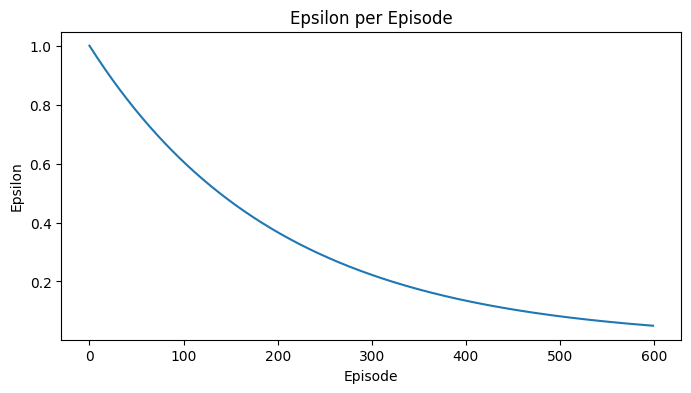

In [42]:
plt.figure(figsize=(8, 4))
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon')
plt.title('Epsilon per Episode')
plt.show()

### Reward over Episodes

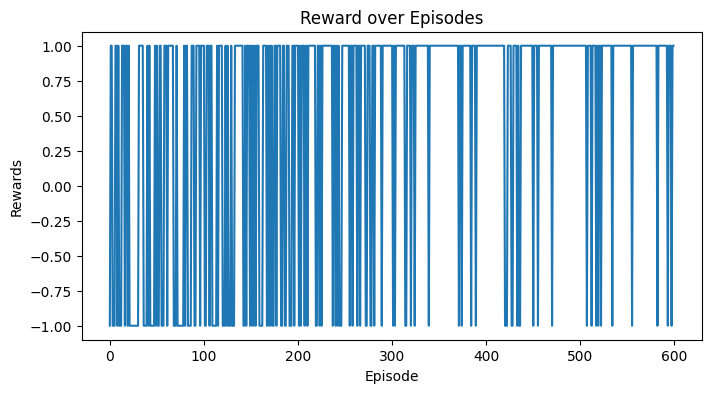

In [43]:
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode")
plt.ylabel("Rewards")
plt.title('Reward over Episodes')
plt.show()

### Number of Steps taken for winning with Reward

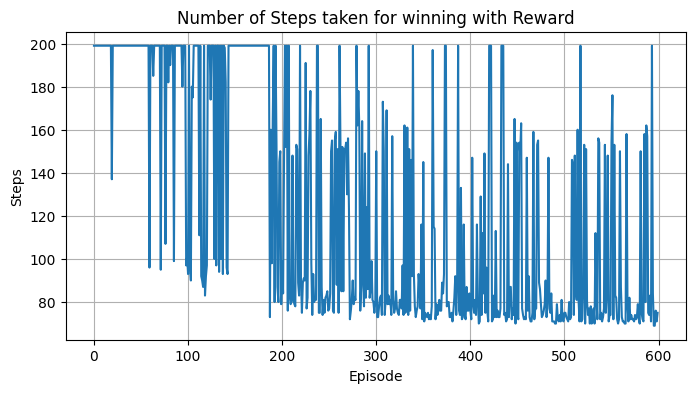

In [44]:
plt.figure(figsize=(8, 4))
plt.plot(step_values)
plt.xlabel("Episode")
plt.ylabel("Steps")
plt.title('Number of Steps taken for winning with Reward')
plt.grid(True)
plt.show()

### Loss over Episode

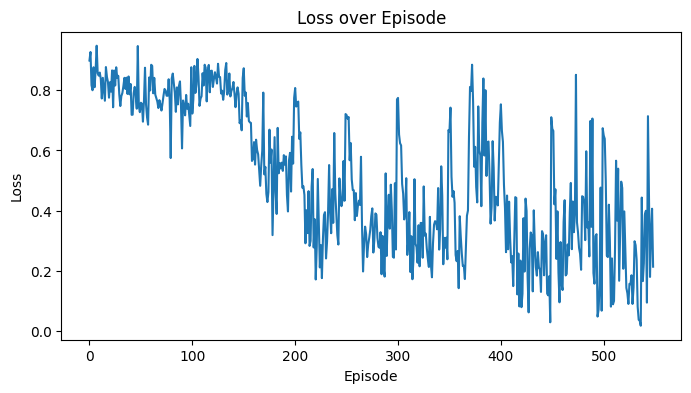

In [45]:
plt.figure(figsize=(8, 4))
plt.plot(loss_values)
plt.xlabel('Episode')
plt.ylabel('Loss')
plt.title('Loss over Episode')
plt.show()

### Saving the model

In [46]:
model_fixed.save('./model_fixed_{}.keras'.format(episode))

### Testing the saved model

In [47]:
from tensorflow.keras.saving import load_model

Test_model_fixed = load_model("./model_fixed_599.keras")

episode_total = 50
steps = 200
frames_per_episode = []
car_reached = 0

for episode in range(episode_total):
    episode_frames  = []
    current_state = env.reset()
    for step in range(steps):
        frame = env.render()
        episode_frames.append(frame)
        action_step = np.argmax(Test_model_fixed.predict(np.expand_dims(current_state, axis=0), verbose=0))
        new_state, reward, done, info = env.step(action_step)
        if done:
            car_reached += 1
            print(f'Car reached in episode: {episode}')
            break
        current_state = new_state
    frames_per_episode.append(episode_frames)
print(f'Car reached the top {car_reached} times out of {episode_total}')

Car reached in episode: 0
Car reached in episode: 1
Car reached in episode: 2
Car reached in episode: 3
Car reached in episode: 4
Car reached in episode: 5
Car reached in episode: 6
Car reached in episode: 7
Car reached in episode: 8
Car reached in episode: 9
Car reached in episode: 10
Car reached in episode: 11
Car reached in episode: 12
Car reached in episode: 13
Car reached in episode: 14
Car reached in episode: 15
Car reached in episode: 16
Car reached in episode: 17
Car reached in episode: 18
Car reached in episode: 19
Car reached in episode: 20
Car reached in episode: 21
Car reached in episode: 22
Car reached in episode: 23
Car reached in episode: 24
Car reached in episode: 25
Car reached in episode: 26
Car reached in episode: 27
Car reached in episode: 28
Car reached in episode: 29
Car reached in episode: 30
Car reached in episode: 31
Car reached in episode: 32
Car reached in episode: 33
Car reached in episode: 34
Car reached in episode: 35
Car reached in episode: 36
Car reached

### Animation of the car

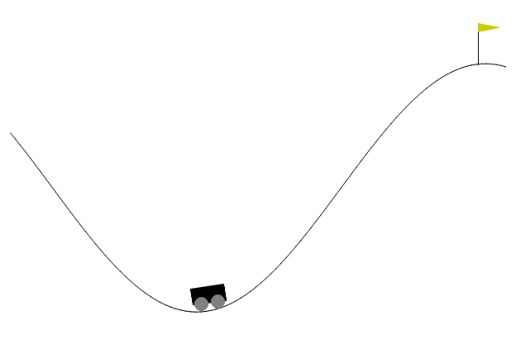

In [48]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter, PillowWriter
from IPython.display import HTML

fig, ax = plt.subplots()

def update(frame):
    ax.clear()
    frame = np.squeeze(frame)
    ax.imshow(frame)
    ax.axis('off')

# Select which episode to animate
episode_to_animate = 17  # Change this to choose different episodes

ani = FuncAnimation(fig, update, frames=frames_per_episode[episode_to_animate], interval=1)
ani.save('Fixed_Animation.gif', writer=PillowWriter(fps=5))
HTML(ani.to_jshtml())

# Double Deep Q-Network

## Hyperparameters

In [49]:
env.reset(seed=42)

epsilon = 1
epsilon_min = .01
epsilon_decay = .995

rewards = []
best_score = 199

loss_values =[]
epsilon_values =[]
step_values = []
policy_values = []

## Model Network

In [50]:
np.random.seed(42)
tf.random.set_seed(42)

input_shape = env.observation_space.shape
n_outputs = env.action_space.n

model_double = tf.keras.Sequential([
    tf.keras.layers.Dense(32, activation="relu", input_shape=input_shape),
    tf.keras.layers.Dense(32, activation="relu"),
    tf.keras.layers.Dense(n_outputs)
])

## Training and Action Step

In [51]:
def epsilon_greedy_policy(state, epsilon):
    if np.random.rand() < epsilon:
        return np.random.randint(n_outputs)
    else:
        Q_values = model_double.predict(state[np.newaxis], verbose=0)[0]
        return Q_values.argmax()

In [52]:
from collections import deque
replay_buffer = deque(maxlen=2000)

In [53]:
def sample_experiences(batch_size):
    indices = np.random.randint(len(replay_buffer), size=batch_size)
    batch = [replay_buffer[index] for index in indices]
    return [
        np.array([experience[field_index] for experience in batch])
        for field_index in range(5)
    ]  # [states, actions, rewards, next_states, dones, truncateds]

In [54]:
def play_one_step(env, state, epsilon):
    action = epsilon_greedy_policy(state, epsilon)
    policy_values.append(action)
    next_state, reward, done, info = env.step(action)
    if next_state[0] - state[0] > 0 and action == 2: reward = 1
    if next_state[0] - state[0] < 0 and action == 0: reward = 1
    replay_buffer.append((state, action, reward, next_state, done))
    return next_state, reward, done, info

In [55]:
target_double = tf.keras.models.clone_model(model_double)
target_double.set_weights(model_double.get_weights())

In [56]:
batch_size = 64
discount_factor = 0.95
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
loss_fn = tf.keras.losses.mean_squared_error

def training_step(batch_size):

    experiences = sample_experiences(batch_size)
    states, actions, rewards, next_states, dones = experiences
    policy_values.append(actions)

    next_Q_values = model_double.predict(next_states, verbose=0)
    max_next_Q_values = next_Q_values.max(axis=1)

    next_target = tf.one_hot(max_next_Q_values, n_outputs).numpy()
    max_next_target_Q_values = (target_double.predict(next_states, verbose=0) * next_target).sum(axis=1)
    runs = 1.0 - (dones)
    target_Q_values = rewards + runs * discount_factor * max_next_target_Q_values
    target_Q_values = target_Q_values.reshape(-1, 1)
    mask = tf.one_hot(actions, n_outputs)
    with tf.GradientTape() as tape:
        all_Q_values = model_double(states)
        Q_values = tf.reduce_sum(all_Q_values * mask, axis=1, keepdims=True)
        loss = tf.reduce_mean(loss_fn(target_Q_values, Q_values))
        loss_values.append(loss)

    grads = tape.gradient(loss, model_double.trainable_variables)
    optimizer.apply_gradients(zip(grads, model_double.trainable_variables))

## Training Model

In [57]:
episodes=600

for episode in range(episodes):
    obs = env.reset()
    for step in range(200):
        obs, reward, done, info  = play_one_step(env,obs, epsilon)
        if done:
            break

    epsilon_values.append(epsilon)
    rewards.append(reward)
    step_values.append(step)

    if epsilon > epsilon_min:
      epsilon *= epsilon_decay

    if episode % 50 == 0:
      target_double.set_weights(model_double.get_weights())

    if step <= best_score:
        best_weights = model_double.get_weights()
        best_score = step

    print("\rEpisode: {}, Step: {}, eps: {:.3f}".format(episode, best_score, epsilon))

    if episode > 50:
        training_step(batch_size)

model_double.set_weights(best_weights)


Episode: 0, Step: 199, eps: 0.995
Episode: 1, Step: 199, eps: 0.990
Episode: 2, Step: 199, eps: 0.985
Episode: 3, Step: 199, eps: 0.980
Episode: 4, Step: 199, eps: 0.975
Episode: 5, Step: 199, eps: 0.970
Episode: 6, Step: 199, eps: 0.966
Episode: 7, Step: 199, eps: 0.961
Episode: 8, Step: 199, eps: 0.956
Episode: 9, Step: 199, eps: 0.951
Episode: 10, Step: 199, eps: 0.946
Episode: 11, Step: 199, eps: 0.942
Episode: 12, Step: 199, eps: 0.937
Episode: 13, Step: 199, eps: 0.932
Episode: 14, Step: 199, eps: 0.928
Episode: 15, Step: 199, eps: 0.923
Episode: 16, Step: 199, eps: 0.918
Episode: 17, Step: 199, eps: 0.914
Episode: 18, Step: 199, eps: 0.909
Episode: 19, Step: 199, eps: 0.905
Episode: 20, Step: 199, eps: 0.900
Episode: 21, Step: 199, eps: 0.896
Episode: 22, Step: 199, eps: 0.891
Episode: 23, Step: 199, eps: 0.887
Episode: 24, Step: 199, eps: 0.882
Episode: 25, Step: 199, eps: 0.878
Episode: 26, Step: 199, eps: 0.873
Episode: 27, Step: 199, eps: 0.869
Episode: 28, Step: 199, eps: 0

## Plotting Results

### Epsilon over Episodes

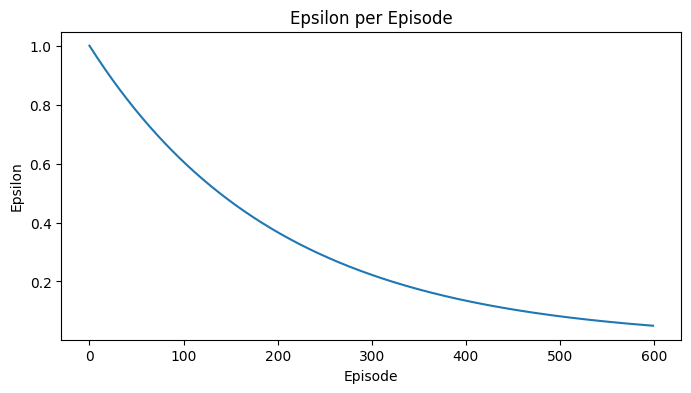

In [58]:
plt.figure(figsize=(8, 4))
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon')
plt.title('Epsilon per Episode')
plt.show()

### Reward over Episodes

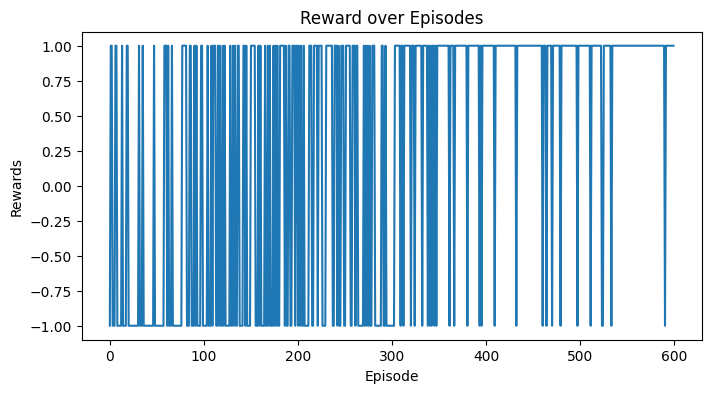

In [59]:
plt.figure(figsize=(8, 4))
plt.plot(rewards)
plt.xlabel("Episode")
plt.ylabel("Rewards")
plt.title('Reward over Episodes')
plt.show()

### Number of Steps taken for winning with Reward

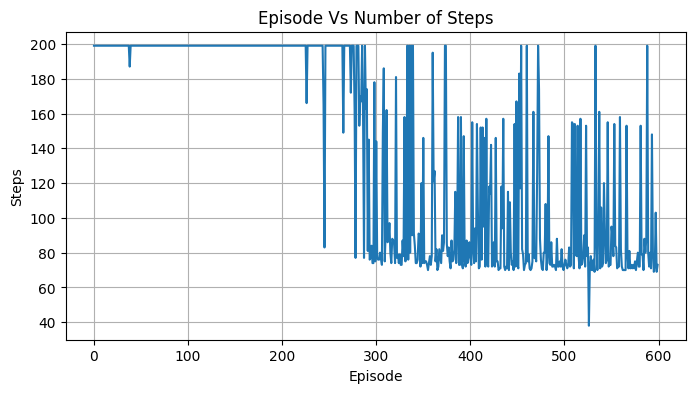

In [60]:
plt.figure(figsize=(8, 4))
plt.plot(step_values)
plt.xlabel("Episode")
plt.ylabel("Steps")
plt.title('Episode Vs Number of Steps')
plt.grid(True)
plt.show()

### Loss over Episode

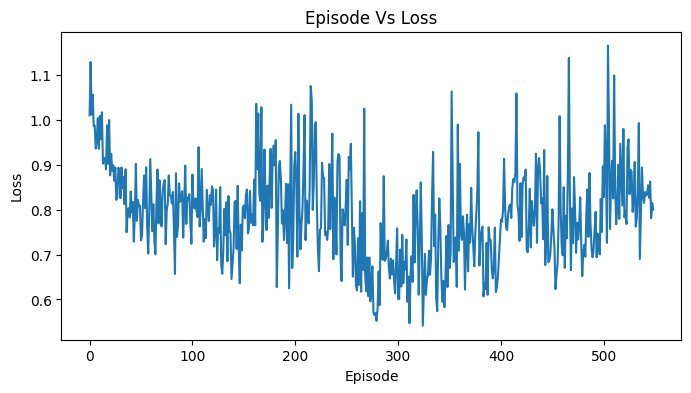

In [61]:
plt.figure(figsize=(8, 4))
plt.plot(loss_values)
plt.xlabel('Episode')
plt.ylabel('Loss')
plt.title('Episode Vs Loss')
plt.show()

### Saving the model

In [62]:
model_double.save('./model_Double_{}.keras'.format(episode))

### Testing the saved model

In [63]:
from tensorflow.keras.saving import load_model

Test_model_double = load_model("./model_Double_599.keras")

episode_total = 50
steps = 200
frames_per_episode = []
car_reached = 0

for episode in range(episode_total):
    episode_frames  = []
    current_state = env.reset()
    for step in range(steps):
        frame = env.render()
        episode_frames.append(frame)
        action_step = np.argmax(Test_model_double.predict(np.expand_dims(current_state, axis=0), verbose=0))
        new_state, reward, done, info = env.step(action_step)
        if done:
            car_reached += 1
            print(f'Car reached in episode: {episode}')
            break
        current_state = new_state
    frames_per_episode.append(episode_frames)
print(f'Car reached the top {car_reached} times out of {episode_total}')

Car reached in episode: 0
Car reached in episode: 1
Car reached in episode: 2
Car reached in episode: 3
Car reached in episode: 4
Car reached in episode: 5
Car reached in episode: 6
Car reached in episode: 7
Car reached in episode: 8
Car reached in episode: 9
Car reached in episode: 10
Car reached in episode: 11
Car reached in episode: 12
Car reached in episode: 13
Car reached in episode: 14
Car reached in episode: 15
Car reached in episode: 16
Car reached in episode: 17
Car reached in episode: 18
Car reached in episode: 19
Car reached in episode: 20
Car reached in episode: 21
Car reached in episode: 22
Car reached in episode: 23
Car reached in episode: 24
Car reached in episode: 25
Car reached in episode: 26
Car reached in episode: 27
Car reached in episode: 28
Car reached in episode: 29
Car reached in episode: 30
Car reached in episode: 31
Car reached in episode: 32
Car reached in episode: 33
Car reached in episode: 34
Car reached in episode: 35
Car reached in episode: 36
Car reached

### Animation of the car

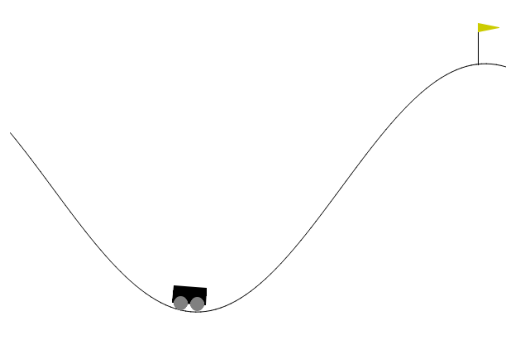

In [64]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter, PillowWriter
from IPython.display import HTML

fig, ax = plt.subplots()

def update(frame):
    ax.clear()
    frame = np.squeeze(frame)
    ax.imshow(frame)
    ax.axis('off')

# Select which episode to animate
episode_to_animate = 41  # Change this to choose different episodes

ani = FuncAnimation(fig, update, frames=frames_per_episode[episode_to_animate], interval=1)
ani.save('Double_Animation.gif', writer=PillowWriter(fps=5))
HTML(ani.to_jshtml())